# Computer Vision color spaces

### Import statements

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

### To edit an image making a copy of it is always a good idea!

In [2]:
!ls img

blue-flowers.jpg      hsv.png		       m.jpg
blue-red-flowers.png  IMG_20210608_162647.jpg  purple-flowers.jpg


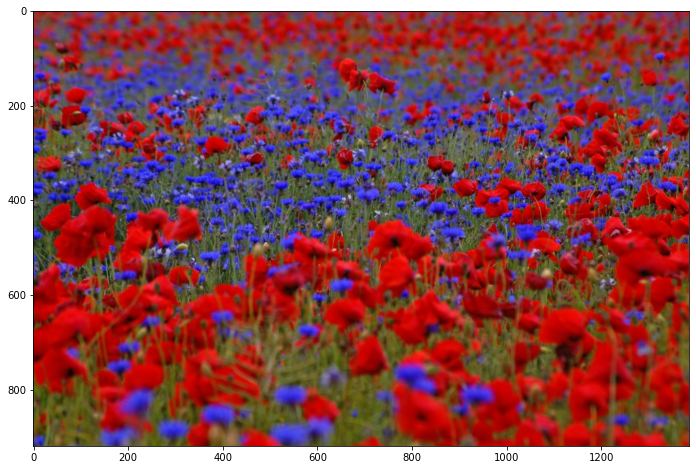

In [3]:
# Load an image
# And make a copy of the original image to avoid manipulating the original image
img = cv2.imread('./img/blue-red-flowers.png')
br_flowers = img.copy()
br_flowers = cv2.cvtColor(br_flowers, cv2.COLOR_BGR2RGB)



plt.figure(figsize=(12,8))
fig = plt.imshow(br_flowers)


[Hint](# "Numpy .copy function") 

## Color Spaces

### BGR Spliting the color channels

In [4]:
# Load a color image and split in is different B, G and R channels
br_flowers = img.copy()

B, G, R = cv2.split(br_flowers)

[Hint](# "cv2.split") 

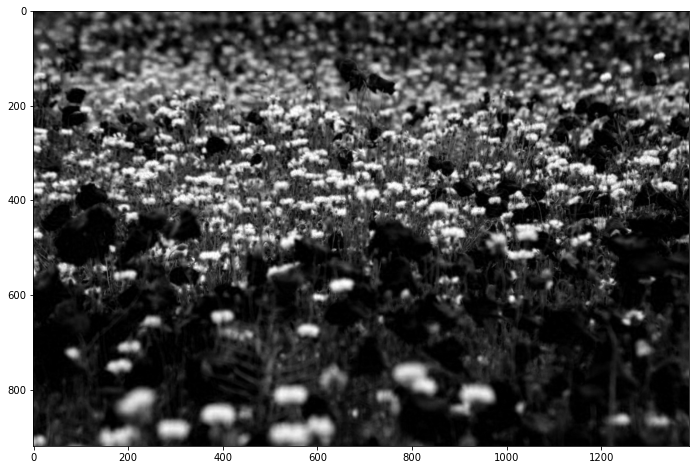

In [5]:
# Show each channel channel on screen
plt.figure(figsize=(12,8))
fig = plt.imshow(B, cmap='gray')

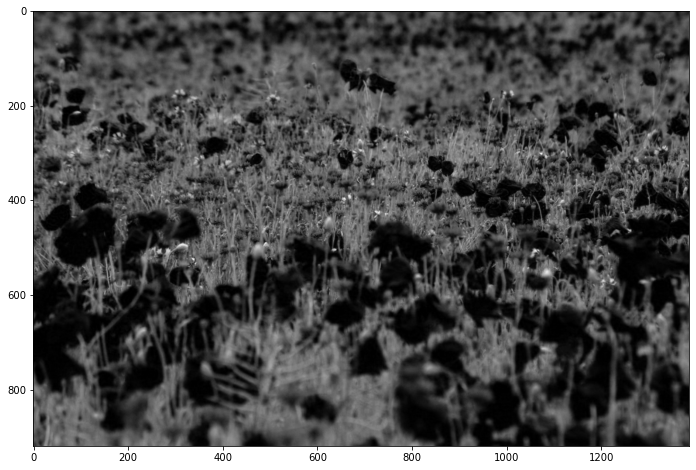

In [6]:
plt.figure(figsize=(12,8))
fig = plt.imshow(G, cmap='gray')

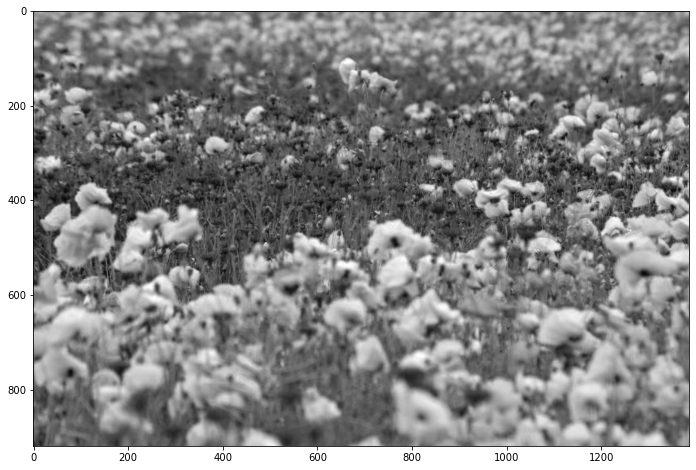

In [7]:
plt.figure(figsize=(12,8))
fig = plt.imshow(R, cmap='gray')

#### Merging the color channels

In [8]:
# Modify a channel and then merge them all again
B = cv2.add(B, 50)

merged = cv2.merge([B, G, R])

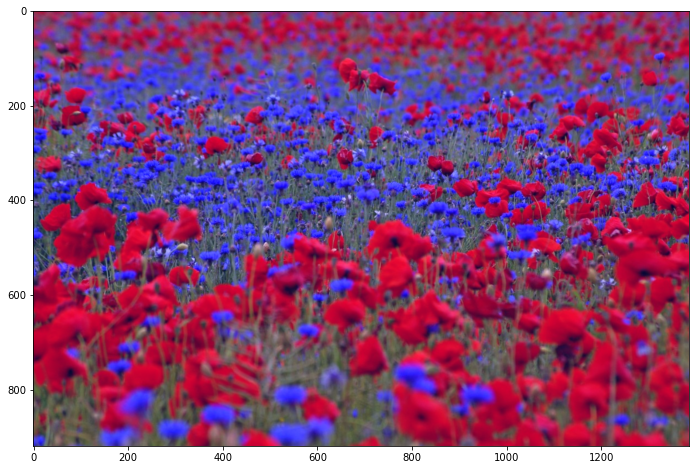

In [9]:
plt.figure(figsize=(12,8))

merged = cv2.cvtColor(merged, cv2.COLOR_BGR2RGB)
fig = plt.imshow(merged)

[Hint](# "cv2.merge") 

In [10]:
# Create a black canvas with the same size as the image you loaded
black = np.zeros(R.shape).astype('uint8')

[Hint](# "use numpy np.zeros function with the img.shape[:2]") 

In [11]:
# Merge each channel with the black canvas 
# So you will end up with 3 images: (Red,Black,Black), (Black,Green,Black) and (Black,Black,Blue) 
# Assuming you are working with RGB, but BGR is also fine
red_black = cv2.merge([R, black, black])
green_black = cv2.merge([black, G, black])
blue_black = cv2.merge([black, black, B])

[Hint](# "cv2.merge") 

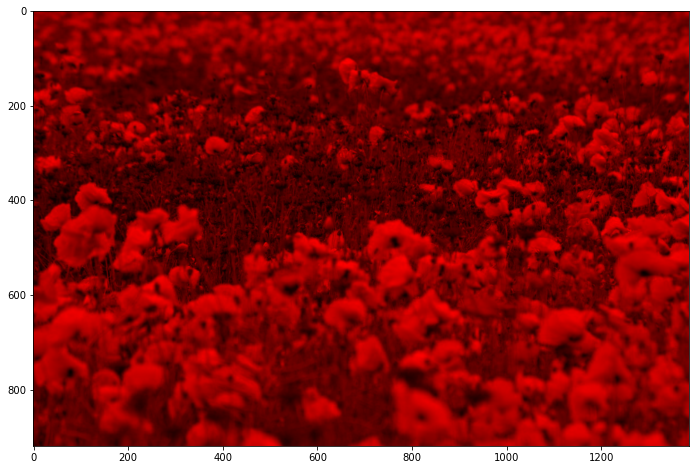

In [12]:
plt.figure(figsize=(12,8))
fig = plt.imshow(red_black)

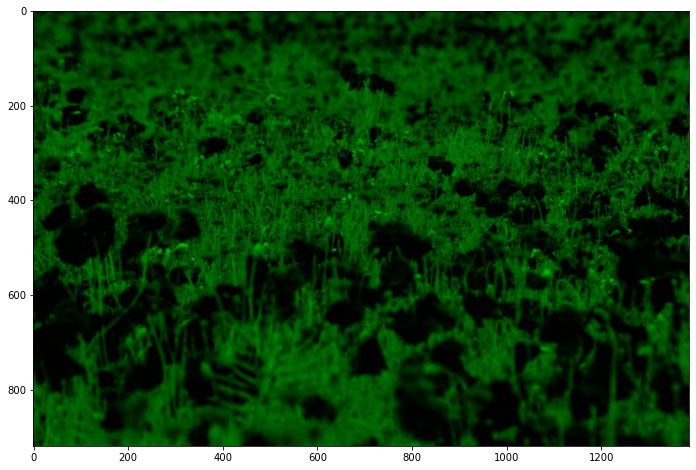

In [13]:
plt.figure(figsize=(12,8))
fig = plt.imshow(green_black)

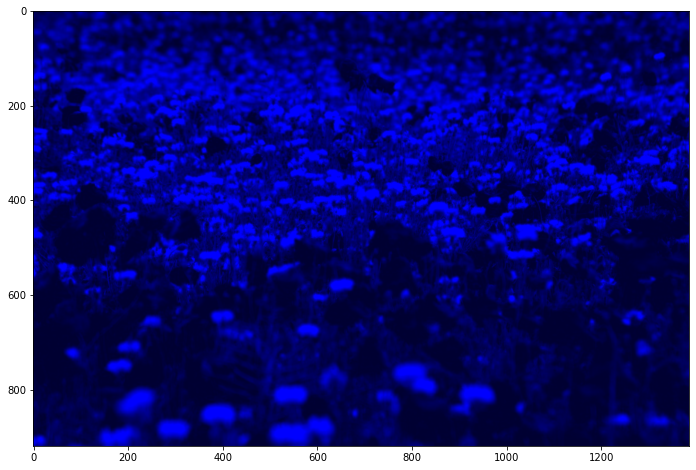

In [14]:
plt.figure(figsize=(12,8))
fig = plt.imshow(blue_black)

### HSV: Hue Saturation Value

#### M&Ms challenge!

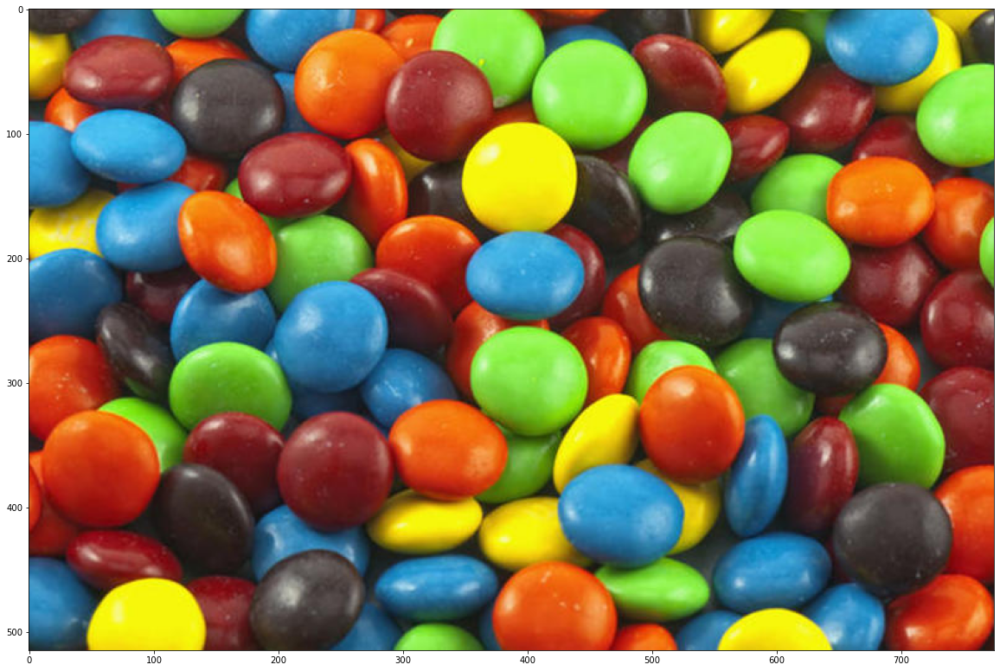

In [15]:
# Use the image below and convert it from BGR to HSV
img = cv2.imread('img/m.jpg')
plt.figure(figsize = (20,15));
plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB));

In [16]:
# Split the H,S and V channels 
hsv_m = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

H, S, V = cv2.split(hsv_m)

[Hint](# "cv2.cvtColor") 

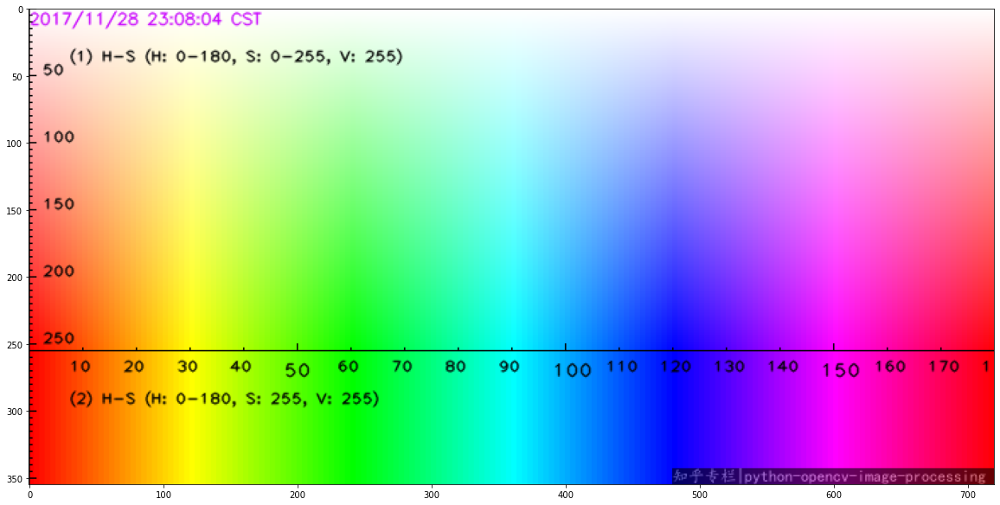

In [17]:
hsv_range = cv2.imread('./img/hsv.png')
# cv2.imshow('hsv_range', hsv_range)
# cv2.waitKey(0)
# cv2.destroyAllWindows()
# cv2.waitKey(1)
plt.figure(figsize = (20,15));
plt.imshow(cv2.cvtColor(hsv_range,cv2.COLOR_BGR2RGB));



array([[  0,   0,   0, ...,   0,   0,   0],
       [  0,   0,   0, ...,   0,   0,   0],
       [  0,   0,   0, ...,   0,   0,   0],
       ...,
       [255, 255, 255, ...,   0,   0,   0],
       [255, 255, 255, ...,   0,   0,   0],
       [255, 255, 255, ...,   0,   0,   0]], dtype=uint8)

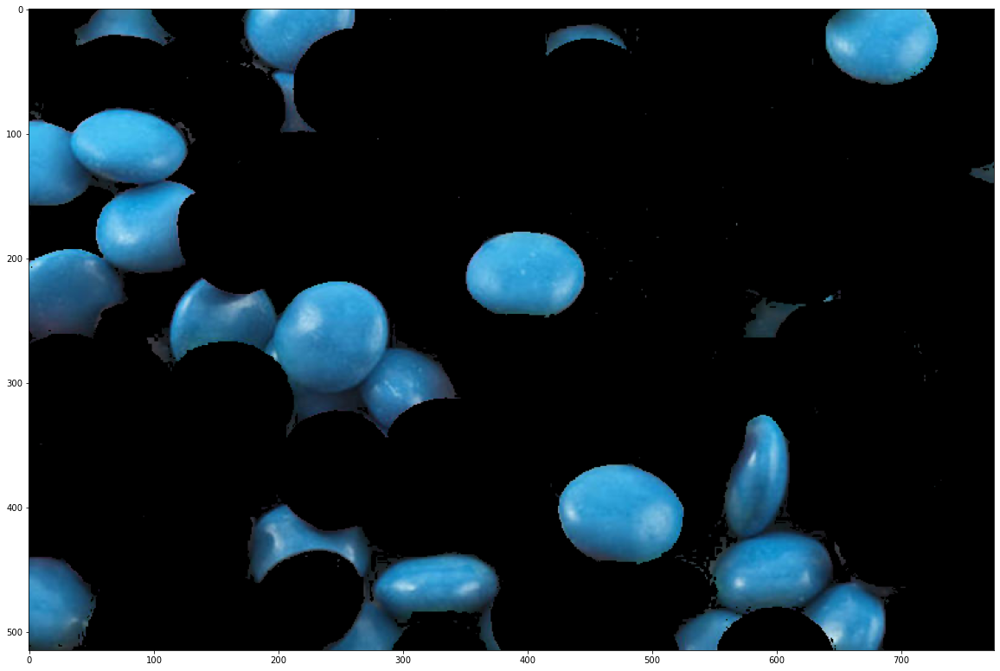

In [18]:
# Create a mask to filter out the Blue M&Ms (remember you need a lower and upper range)
# Make a copy of the hsv image and apply the mask to it, then display the image
lower_blue = (90, 20, 0)
upper_blue = (140, 255, 255)

blue_filter = cv2.inRange(hsv_m, lower_blue, upper_blue)
masked_mm = img.copy()

masked_mm[blue_filter == 0] = [0, 0, 0]

plt.figure(figsize = (20,15));
plt.imshow(cv2.cvtColor(masked_mm,cv2.COLOR_BGR2RGB));
blue_filter

[Hint](# "cv2.inRange") 

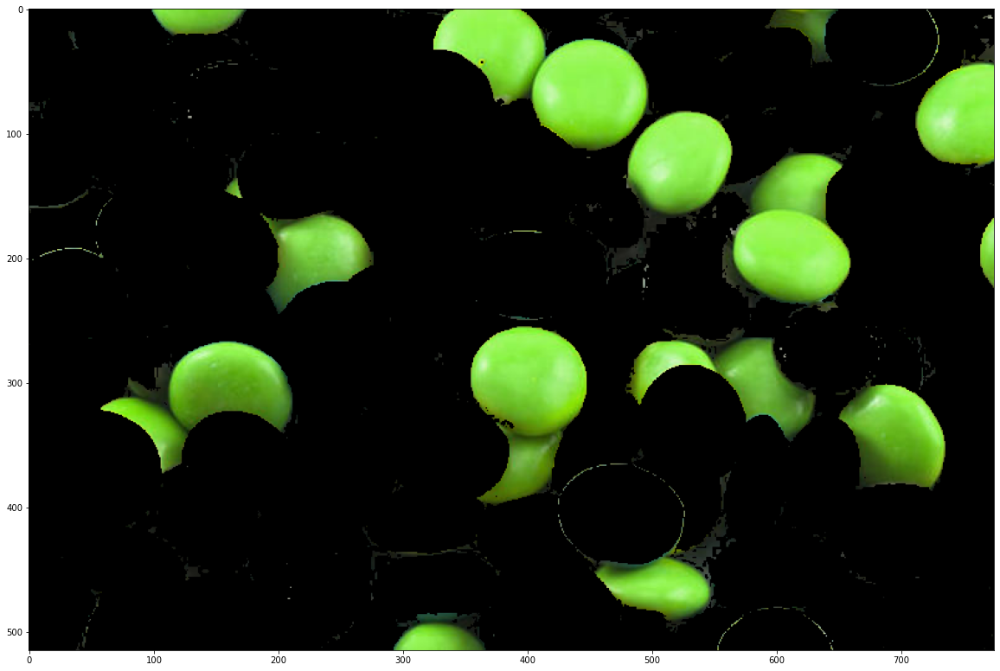

In [19]:
# Repeat the same but now with the greens
lower_green = (35, 20, 0)
upper_green = (80, 255, 255)

green_filter = cv2.inRange(hsv_m, lower_green, upper_green)
masked_mm = img.copy()

masked_mm[green_filter == 0] = [0, 0, 0]

plt.figure(figsize = (20,15));
plt.imshow(cv2.cvtColor(masked_mm,cv2.COLOR_BGR2RGB));
# green_filter

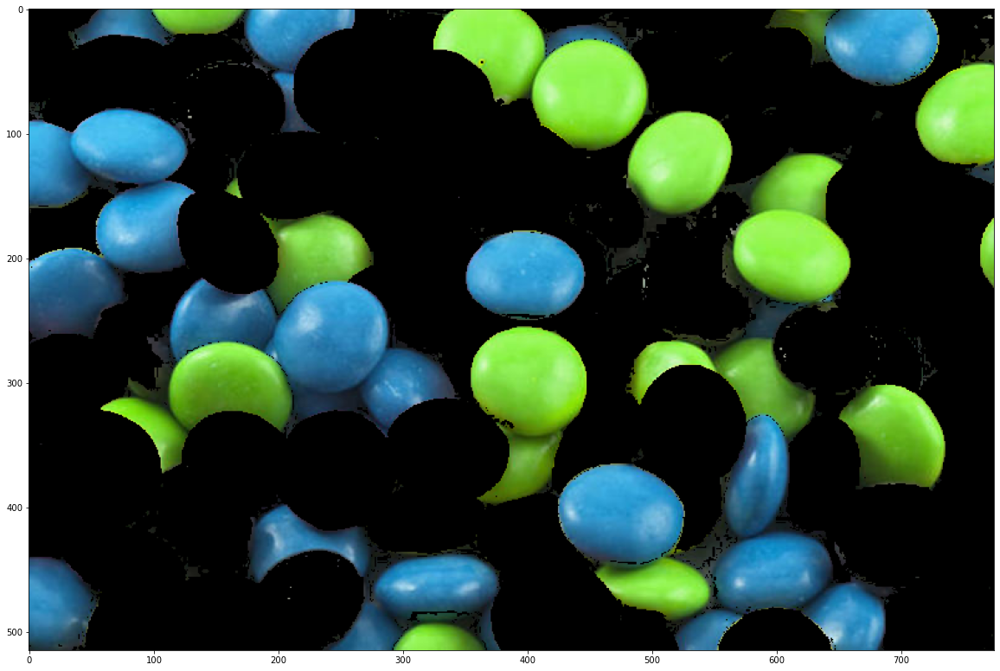

In [20]:
# Now combine both masks togheter so we can see all greens and blues in the same image!
gb_filter = cv2.add(blue_filter, green_filter)
masked_mm = img.copy()

masked_mm[gb_filter == 0] = [0, 0, 0]

plt.figure(figsize = (20,15));
plt.imshow(cv2.cvtColor(masked_mm,cv2.COLOR_BGR2RGB));

# plt.figure(figsize = (20,15));
# plt.imshow(gb_filter);

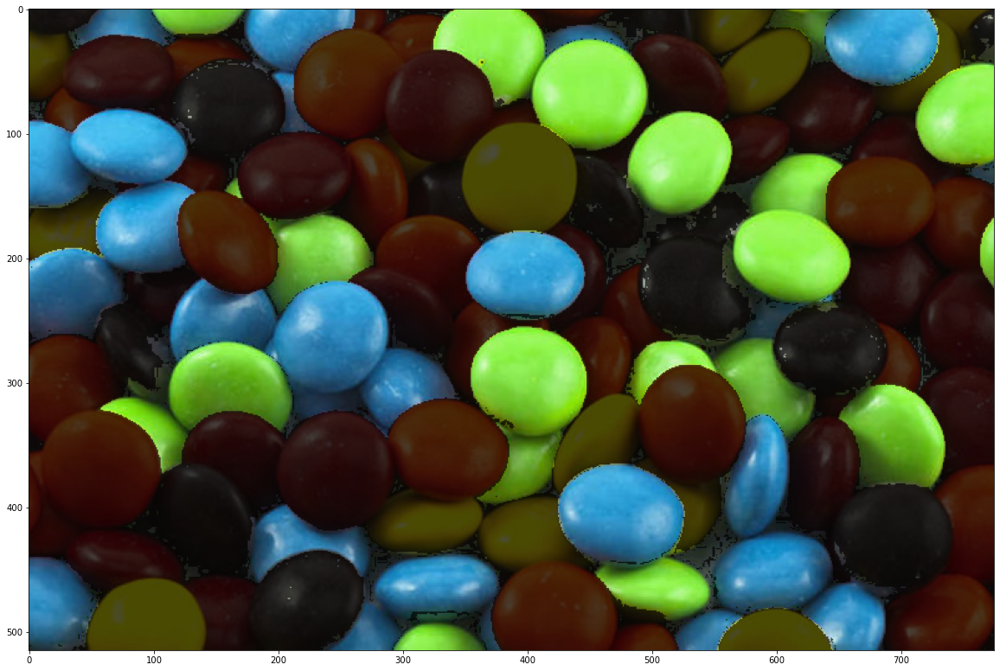

In [21]:
# Now lets combine both masks but also some opacity, we want to be able to see all M&Ms but
# Blues and greens will show as int he image above while the other colors will be faded out with some opacity
# You just need to add alpha to apply opacity to the dark parts of the mask, then display the image

masked_mm_2 = img.copy()
black_mm = np.zeros(blue_filter.shape).astype('uint8')

opacity = 0.3

overlayed = cv2.addWeighted(masked_mm_2, opacity, masked_mm, 1 - opacity, 0)

plt.figure(figsize = (20,15));
plt.imshow(cv2.cvtColor(overlayed,cv2.COLOR_BGR2RGB));





[Hint](# "cv2.addWeighted") 

In [22]:
# Below you will find an example with oranges and greens just for reference so you can see what we want to accomplish
# In this example the oranges are not perfect, and it can be improved a lot easily.

## Mini project

### Level 1

#### Ball tracker

1. Given an image with a ball on it isolate the ball

### Level 2

#### Ball tracker

1. Make it track a ball in real time (either with a video or a webcam)

In [44]:
# CAPTURE VIDEO
video = cv2.VideoCapture(0)
lower_yellow = (20, 50, 10)
upper_yellow = (50, 210, 255)

        
# lower_red = (0, 20, 0)
# upper_red = (10, 255, 255)
# lower_red = (0, 20, 0)
# upper_red = (10, 255, 255)
while(video.isOpened()):
    check, frame = video.read()
    if frame is not None:
        # img = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        camera_img = frame
        hsv_m = cv2.cvtColor(camera_img, cv2.COLOR_BGR2HSV)

        yellow_filter = cv2.inRange(hsv_m, lower_yellow, upper_yellow)
        masked_mm = camera_img.copy()

        # coord = get_mask_coords(yellow_filter)
        # center = mask_center(coord)

        masked_mm[yellow_filter == 0] = [0, 0, 0]
        # cv2.circle(masked_mm, center, 10, (0, 255, 0), 3)

        cv2.imshow('frame',masked_mm)        
        if cv2.waitKey(30) & 0xFF == ord('q'):
            break
    else:
        break

#  rgba(170,177,38,255)
video.release()
cv2.destroyAllWindows()
cv2.waitKey(1)

-1

### Level 3

#### Ball Tracker

1. Can you make it track two or more different color balls at the same time?